# Computer Vision 2025 Assignment 1: Image filtering.

In this assignment you will research, implement and test some image filtering operations. Image filtering by convolution is a fundamental step in many computer vision tasks, and you will find it useful to have a firm grasp of how it works.
For example, later in the course we will come across Convolutional Neural Networks (CNNs) which are a combination of convolutional filters learned to solve specific tasks.

The main aims of the assignment are:

- to understand the basics of how images are stored and processed in memory;
- to gain exposure to several common image filters, and understand how they work;
- to get practical experience implementing convolutional image filters;
- to test your intuition about image filtering by running some experiments;
- to report your results in a clear and concise manner.

*This assignment relates to the following ACS CBOK areas: abstraction, design, hardware and software, data and information, HCI and programming.*

## General instructions

Follow the instructions in this Python notebook and the accompanying file *a1code.py* to answer each question. It's your responsibility to make sure your answer to each question is clearly labelled and easy to understand. Note that most questions require some combination of Python code, graphical output, and text analysing or describing your results. Although we will check your code as needed, marks will be assigned primarily based on the quality of your report rather than for the code itself! We are more interested in your understanding of the topic but code clarify, logic, and commenting reflect tge depth of your understanding as well!

Only a small amount of code is required to answer each question. We will make extensive use of the Python libraries

- [numpy](numpy.org) for mathematical functions
- [skimage](https://scikit-image.org) for image loading and processing
- [matplotlib](https://matplotlib.org/stable/index.html) for displaying graphical results
- [jupyter](https://jupyter.org) for Jupyter Notebooks

You should get familiar with the documentation for these libraries so that you can use them effectively.

# The Questions

To get started, below is some setup code to import the libraries we need. You should not need to edit it.

In [1]:
# Numpy is the main package for scientific computing with Python.
import numpy as np

#from skimage import io

# Imports all the methods we define in the file a1code.py
from a1code import *

# Matplotlib is a useful plotting library for python
import matplotlib.pyplot as plt
# This code is to make matplotlib figures appear inline in the
# notebook rather than in a new window.
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# Some more magic so that the notebook will reload external python modules;
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

## Question 0: Numpy warm up! (Not Assesed. This part is for you to understand the basic of numpy)

Before starting the assignment, make sure you have a working Python 3 installation, with up to date versions of the libraries mentioned above. If this is all new to you, I'd suggest  downloading an all in one Python installation such as [Anaconda](https://www.anaconda.com/products/individual). Alternatively you can use a Python package manager such as pip or conda, to get the libraries you need. If you're struggling with this please ask a question on the MyUni discussion forum.

For this assignment, you need some familiarity with numpy syntax. The numpy QuickStart should be enough to get you started:

https://numpy.org/doc/stable/user/quickstart.html

Here are a few warm up exercises to make sure you understand the basics. Answer them in the space below. Be sure to print the output of each question so we can see it!

1. Create a 1D numpy array Z with 12 elements. Fill with values 1 to 12.
2. Reshape Z into a 2D numpy array A with 3 rows and 4 columns.
3. Reshape Z into a 2D numpy array B with 4 rows and 3 columns.
4. Calculate the *matrix* product of A and B.
5. Calculate the *element wise* product of $A$ and $B^T$ (B transpose).


In [3]:
z= np.array([1,2,3,4,5,6,7,8,9,10,11,12])
print(z)

[ 1  2  3  4  5  6  7  8  9 10 11 12]


In [5]:
A = z.reshape(3,4)
print(A)

[[ 1  2  3  4]
 [ 5  6  7  8]
 [ 9 10 11 12]]


In [6]:
B = z.reshape(4,3)
print(B)

[[ 1  2  3]
 [ 4  5  6]
 [ 7  8  9]
 [10 11 12]]


In [7]:
A @ B 

array([[ 70,  80,  90],
       [158, 184, 210],
       [246, 288, 330]])

In [8]:
Bt = B.T
print(Bt)

A*Bt

[[ 1  4  7 10]
 [ 2  5  8 11]
 [ 3  6  9 12]]


array([[  1,   8,  21,  40],
       [ 10,  30,  56,  88],
       [ 27,  60,  99, 144]])

You need to be comfortable with numpy arrays because that is how we store images. Let's do that next!

## Question 1: Loading and displaying an image (10%)

Below is a function to display an image using the pyplot module in matplotlib. Implement the `load()` and `print_stats()` functions in a1code.py so that the following code loads the mandrill image, displays it and prints its height, width and channel.

In [2]:
def display(img, caption=''):
    # Show image using pyplot
    plt.figure()
    plt.imshow(img)
    plt.title(caption)
    plt.axis('off')
    plt.show()

The typical techniques of image processing perform more efficiently, when pixel values are within [0.0,1.0] rather than [0 255]. It simplifies maths and eliminates the issue of overflow/rounding during calculations.

There are black and white (grayscale) and colored pictures. I turn black and white images into color like images to ensure they behave in the same way towards my code. This prevents issues in the future and everything will stay regular when using edits or filters.

Before that grey scale is like (100, 100) which is (height, width) but after turning them to interpret as rgb they look like (100, 100, 3) which is (height, width, channel). And making sure the images i process have 3 channels.

In [3]:
from a1code import load
from a1code import print_stats

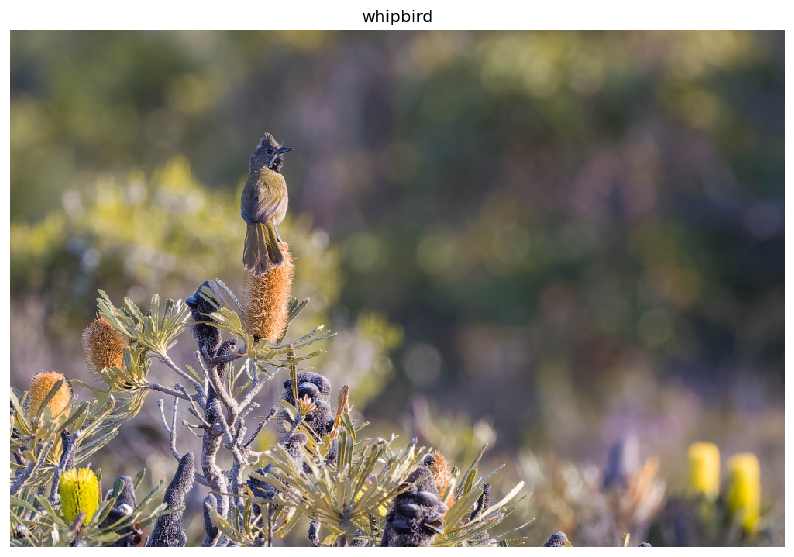

Height: 667
Width: 1000
Channels: 3


In [5]:
image1 = load('whipbird.jpg')

display(image1, 'whipbird')

print_stats(image1)

I have also tried loading the image by OpenCV, but the colour was entirely different. OpenCV loads the images in BGR(blue, green, red) format. when we use imshow() directly after reading the image with opencv, we are plotting the BGR values rather than RGB which results in wrong colours.


In [7]:
def apply_point_processes(img):
    
    inverted = 1.0 - img
    lightened = np.clip(img + 0.3, 0.0, 1.0)
    darkened = np.clip(img - 0.3, 0.0, 1.0)
    raised_contrast = np.clip((img - 0.5) * 1.5 + 0.5, 0.0, 1.0)
    lowered_contrast = np.clip((img - 0.5) * 0.5 + 0.5, 0.0, 1.0)

    return {
        'Original': img,
        'Inverted': inverted,
        'Lightened': lightened,
        'Darkened': darkened,
        'Contrast +': raised_contrast,
        'Contrast -': lowered_contrast
    }


In [8]:
def display_point_processes(processed_images, title_prefix=''):
    titles = list(processed_images.keys())
    imgs = list(processed_images.values())

    plt.figure(figsize=(18, 8))
    for i, (title, img) in enumerate(zip(titles, imgs)):
        plt.subplot(2, 3, i + 1)
        plt.imshow(img)
        plt.title(f'{title_prefix} {title}')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

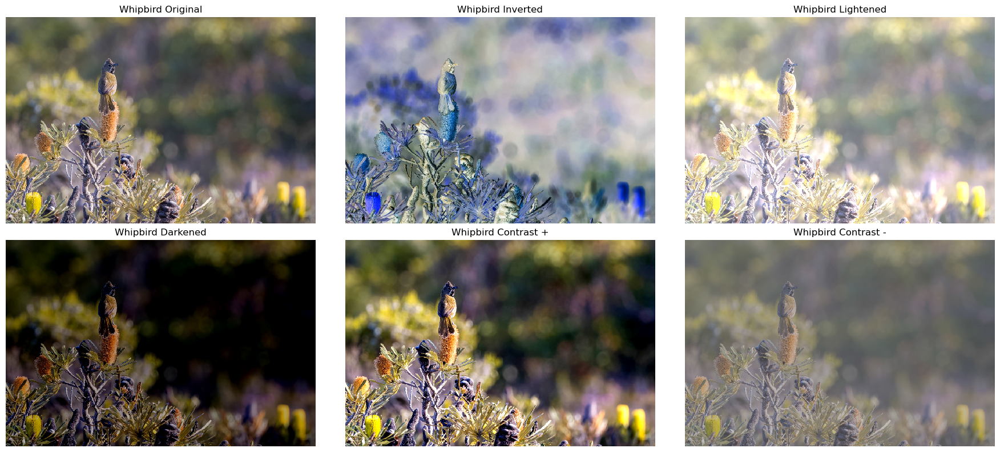

In [9]:
point_processed_images = apply_point_processes(image1)
display_point_processes(point_processed_images, title_prefix='Whipbird')

Return to this question after reading through the rest of the assignment. Find **at least 2 more images** to use as test cases in this assignment for all the following questions and display them below. Use your print_stats() function to display their height, width and number of channels. Explain *why* you have chosen each image.

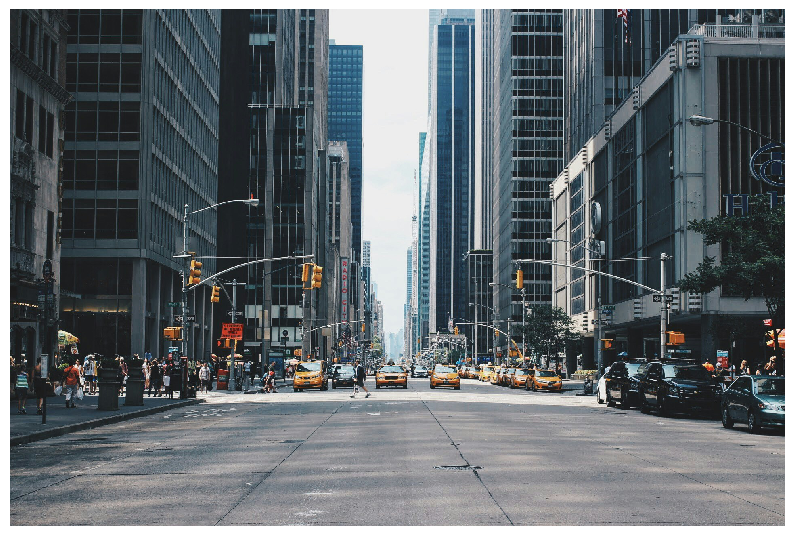

Height: 1280
Width: 1920
Channels: 3


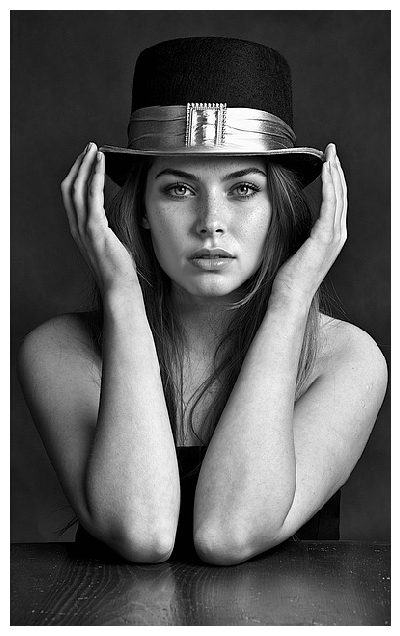

Height: 640
Width: 395
Channels: 3


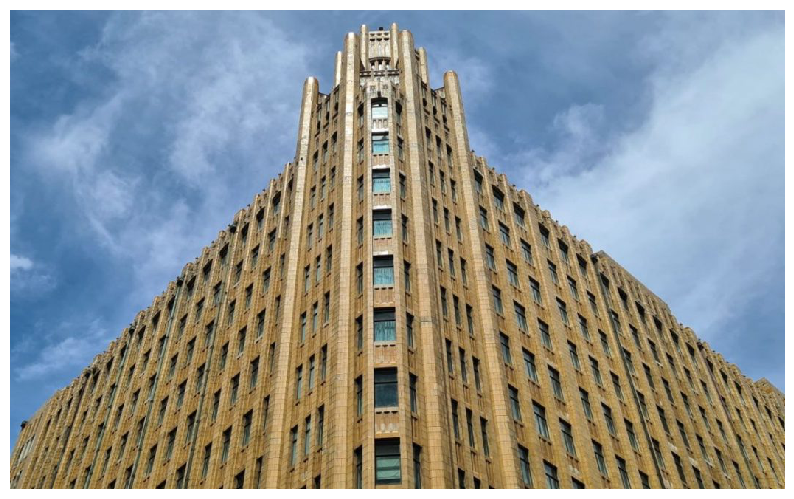

Height: 650
Width: 1051
Channels: 3


In [6]:
images = [
    ('rgbcity.jpg'),
    ('B&W.jpg'),
    ('building.jpg')
]
for filename in images:
    img = load(filename)
    display(img)
    print_stats(img)

Height: 1280
Width: 1920
Channels: 3


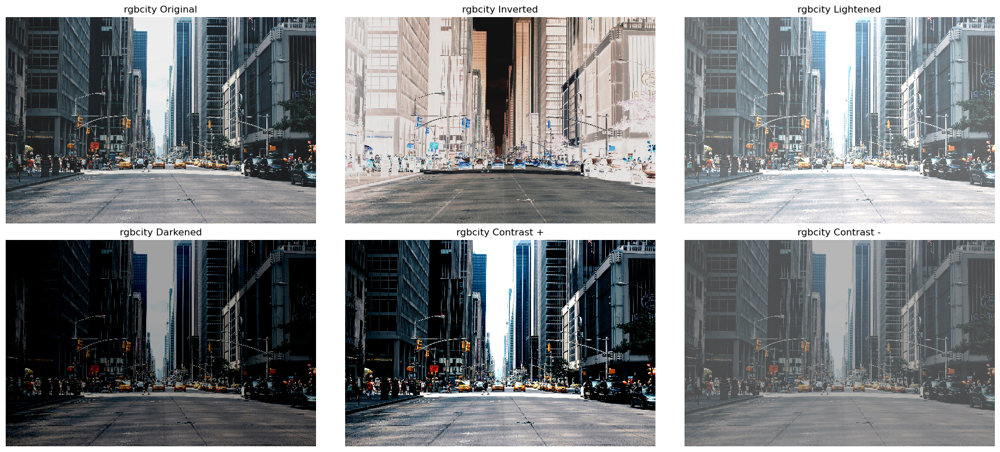

Height: 640
Width: 395
Channels: 3


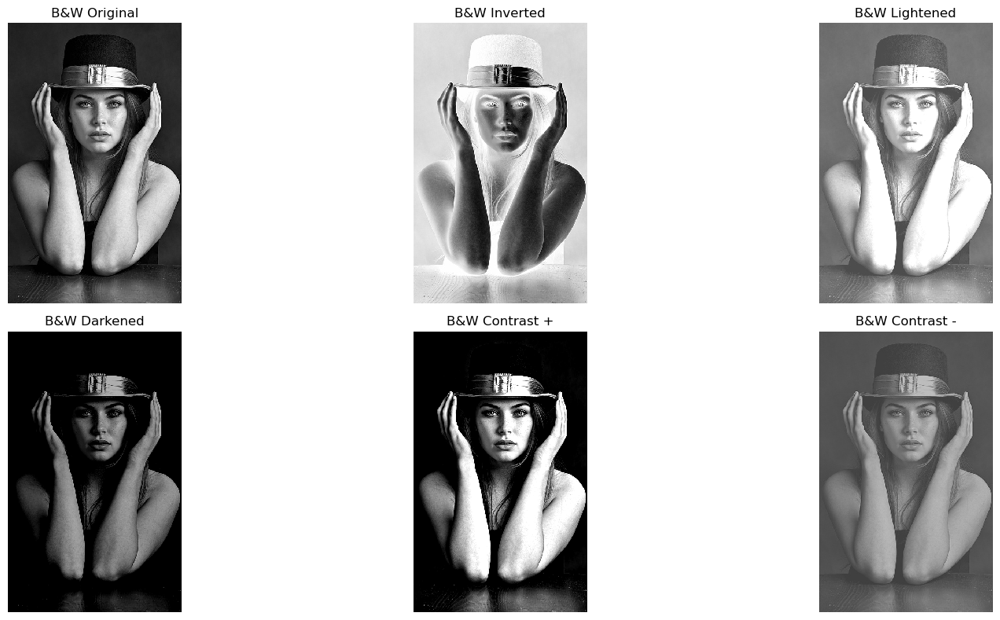

Height: 650
Width: 1051
Channels: 3


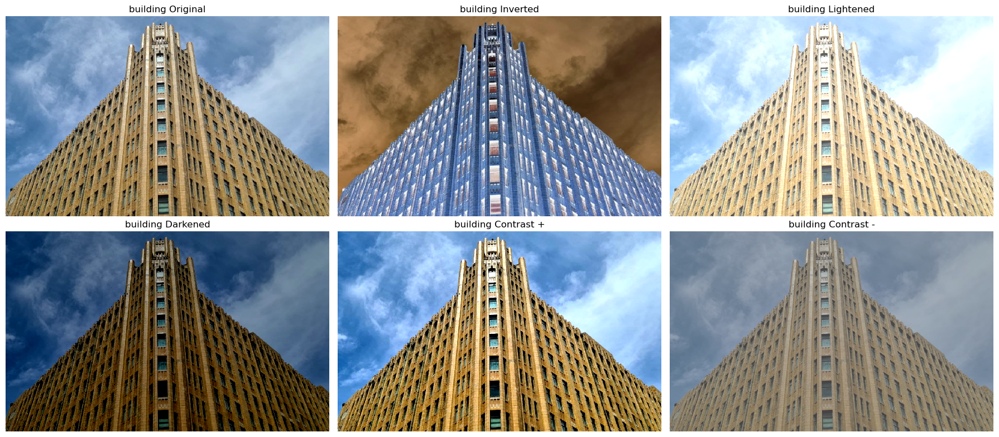

In [11]:
for filename in images:
    img = load(filename)
    print_stats(img)

    processed = apply_point_processes(img)
    display_point_processes(processed, title_prefix=filename.split('.')[0])

Why i chose these images?

I have chosen these three images specifically so as to address many of the features and issues that arise in computer vision tasks. The first image is RGB photograph of city buildings and traffic signals, which encloses complicated urban construction, different color and small items such as traffic lights. This photo challenges how the algorithms perform with real-life scenes of a variety of textures, colors, and small objects. The other one is a black-and-white portraiture of a girl with a hat, which gives a pure emphasis in facial structure and shading devoid of color. This black and white image is useful in assessing edge detection, contrast and shape extraction using a simpler color space, which is useful in tasks such as segmentation and localization of features. The third picture was an RGB architectural photograph with the front half of a building and the defining features of that photograph are high geometric shapes, lines and symmetry. The figure complicates location of the structural edges and patterns needed in object identification, architectural and scene interpretation. Collectively they offer a balanced series of scenarios to challenge various features of computer vision such as processing color, texture and detail, extraction of shapes and recognition of geometric features.

What happens when a processed pixel value becomes < 0 or > 255,
and what effect does this have on later processing?

When the pixel values exceed 255 or fall below 0, it will be invalid in normal images. This could result in wrong colors appearing, visual glitches or unpredictable behavior of filters. In order to prevent such issues, the pixel values are typically clipped to the correct range (0 255) so that the image is rendered and processed properly.
When processing the image, the pixel values that are below 0 or above 255 should be redressed otherwise it may lead to various troubles later on. Such filters as blurring filters, sharpening filters, or edge detectors assume that pixel values fall in a valid range and out-of-range values may cause invalid or noisy outputs. Whenever you show such images to you may encounter unusually colored pixels, areas washed-out or other visual bugs since display building blocks anticipate pixels inside acceptable bounds. Also, certain image processing processes can raise errors or act unpredictably in reaction to invalid data. Lastly, saving picture data with pixel values beyond the usual specification can spoil the file, and the picture would not be shown properly the next time the file is opened. This is why it is necessary to take into consideration the pixel values that should fall into the acceptable range between 0 and 255 to handle, display and store the right images.

Apply the point process only to one channel of the image (red, green or blue). Display the resulting RGB image

In [12]:
def point_process_to_channel(img, channel=0, process='invert'):
    img_ch = img.copy()
    ch = img_ch[:, :, channel]

    if process == 'original':
        ch_processed = ch
    elif process == 'invert':
        ch_processed = 1.0 - ch
    elif process == 'lighten':
        ch_processed = np.clip(ch + 0.3, 0.0, 1.0)
    elif process == 'darken':
        ch_processed = np.clip(ch - 0.3, 0.0, 1.0)
    elif process == 'contrast+':
        ch_processed = np.clip((ch - 0.5) * 1.5 + 0.5, 0.0, 1.0)
    elif process == 'contrast-':
        ch_processed = np.clip((ch - 0.5) * 0.5 + 0.5, 0.0, 1.0)
    else:
        raise ValueError(f"Unknown process type: {process}")

    img_ch[:, :, channel] = ch_processed
    return img_ch


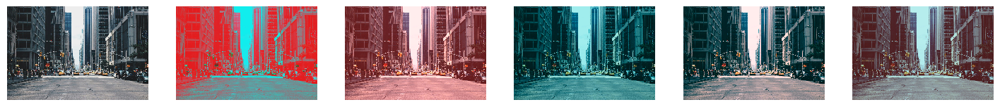

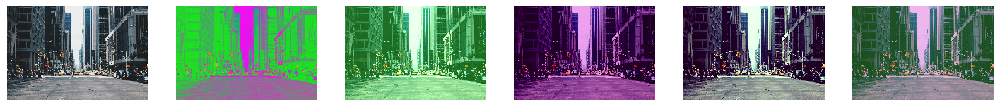

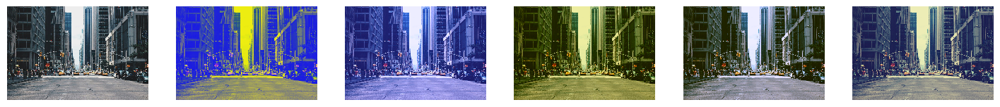

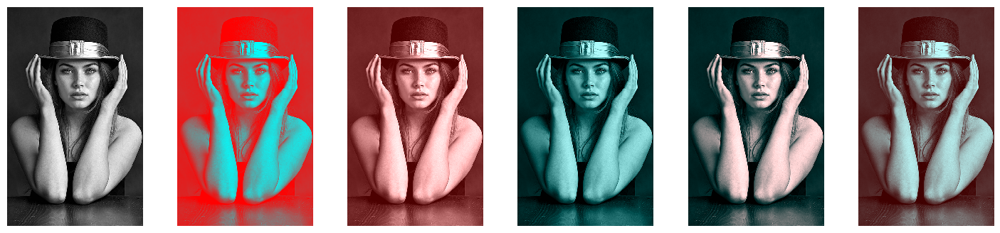

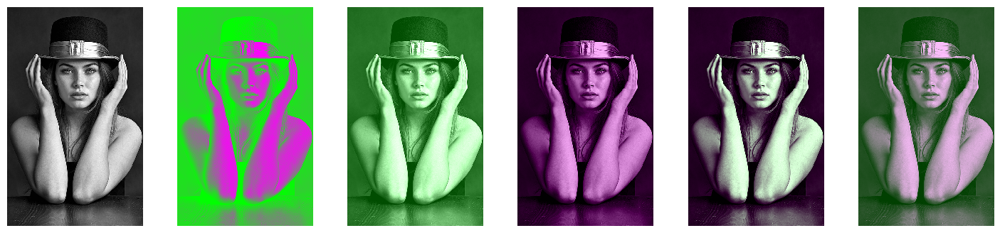

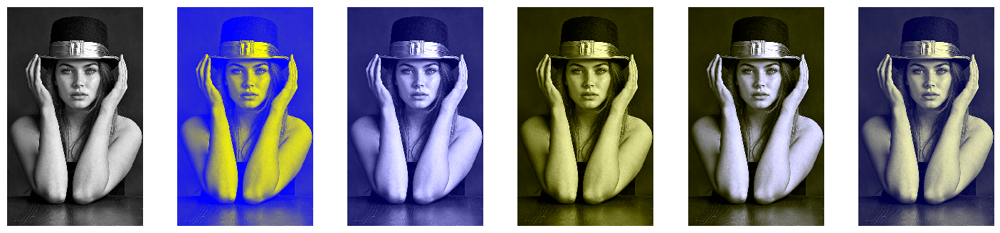

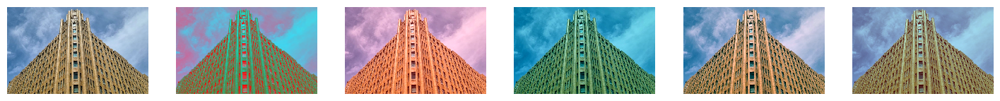

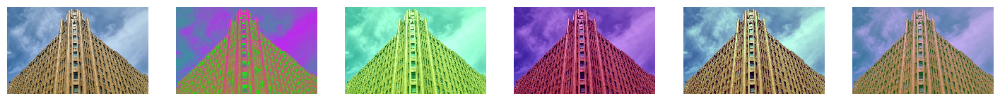

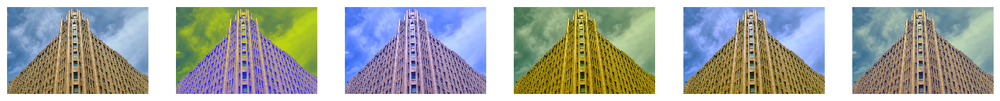

In [14]:
point_processors = ['original', 'invert', 'lighten', 'darken', 'contrast+', 'contrast-']

for filename in images:
    img = load(filename)
    
    for ch in [0, 1, 2]:
        processed_versions = []
        for proc in point_processors:
            processed_img = point_process_to_channel(img, ch, proc)
            processed_versions.append(processed_img)

        plt.figure(figsize=(18, 4))
        for i, proc_img in enumerate(processed_versions):
            plt.subplot(1, 6, i + 1)
            plt.imshow(proc_img)
            plt.axis('off')
        plt.show()

## Question 2: Image processing (20%)

Now that you have an image stored as a numpy array, let's try some operations on it.

1. Implement the `crop()` function in a1code.py. Use array slicing to crop the image.
2. Implement the `resize()` function in a1code.py.
3. Implement the `change_contrast()` function in a1code.py.
4. Implement the `greyscale()` function in a1code.py.
5. Implement the `binary()` function in a1code.py.

What do you observe when you change the threshold of the binary function?

Apply all these functions with different parameters on your own test images.

In [7]:
from a1code import crop
from a1code import change_contrast
from a1code import resize
from a1code import greyscale
from a1code import binary


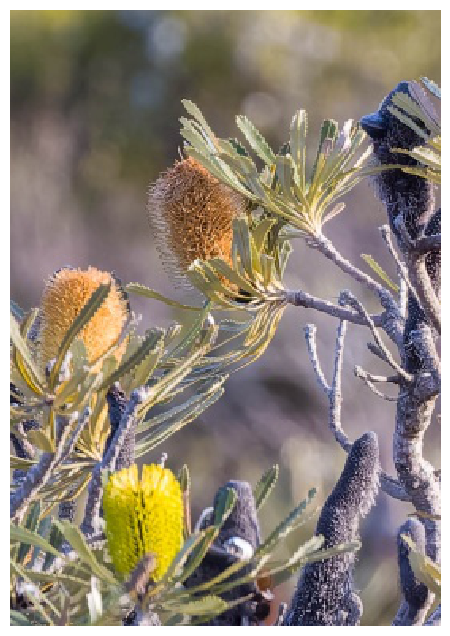

Height: 389
Width: 272
Channels: 3


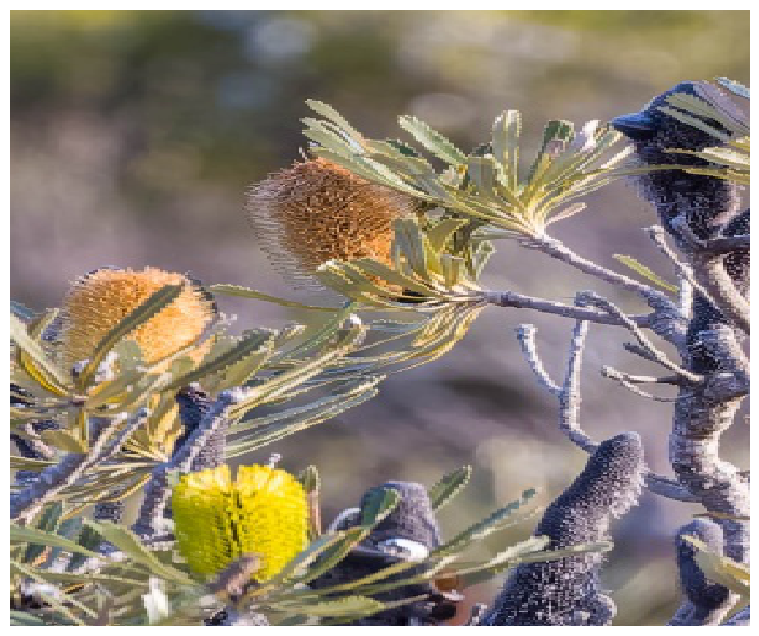

Height: 500
Width: 600
Channels: 3


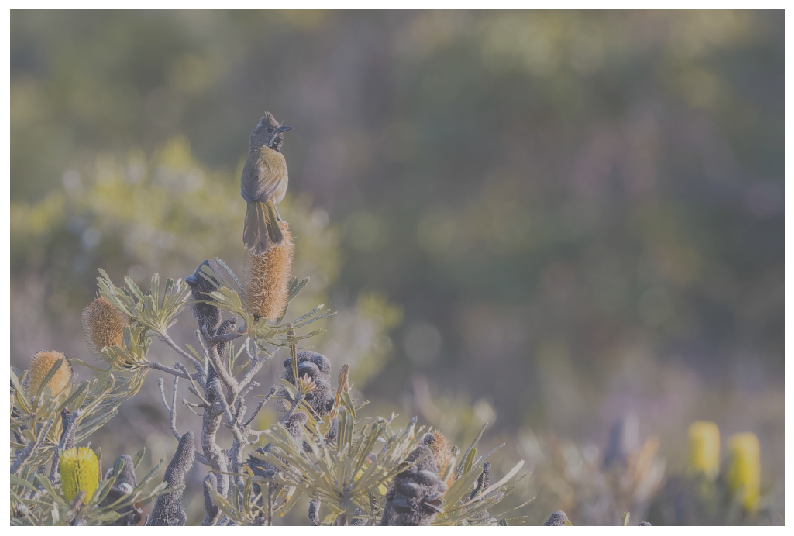

Height: 667
Width: 1000
Channels: 3


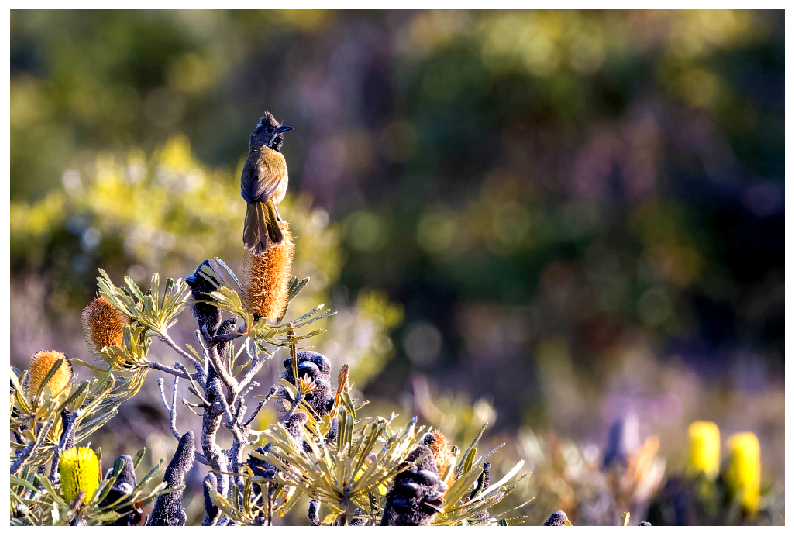

Height: 667
Width: 1000
Channels: 3


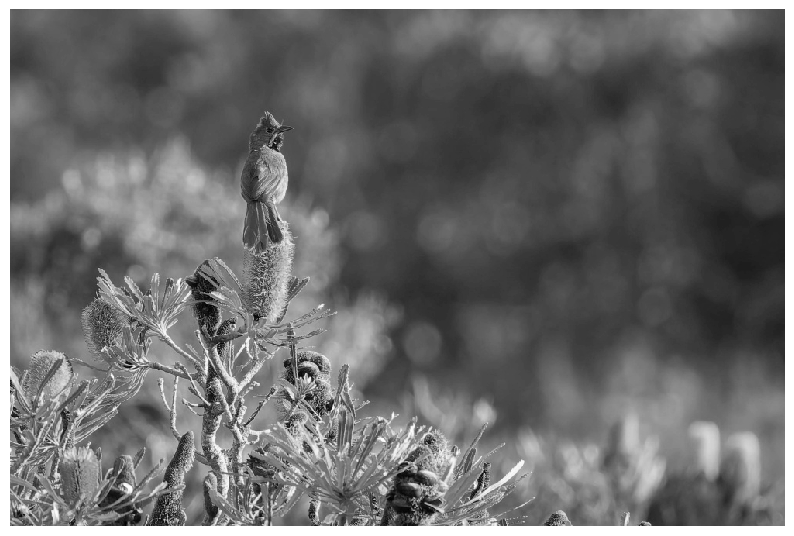

Height: 667
Width: 1000
Channels: 1


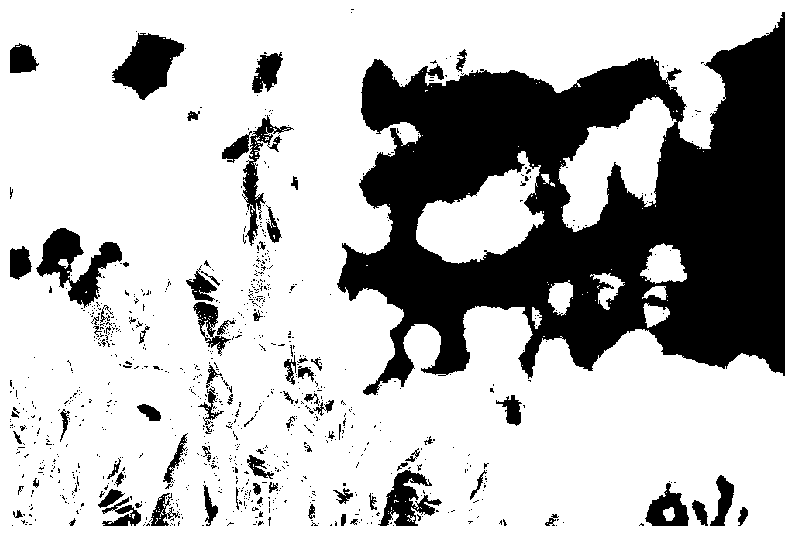

Height: 667
Width: 1000
Channels: 1


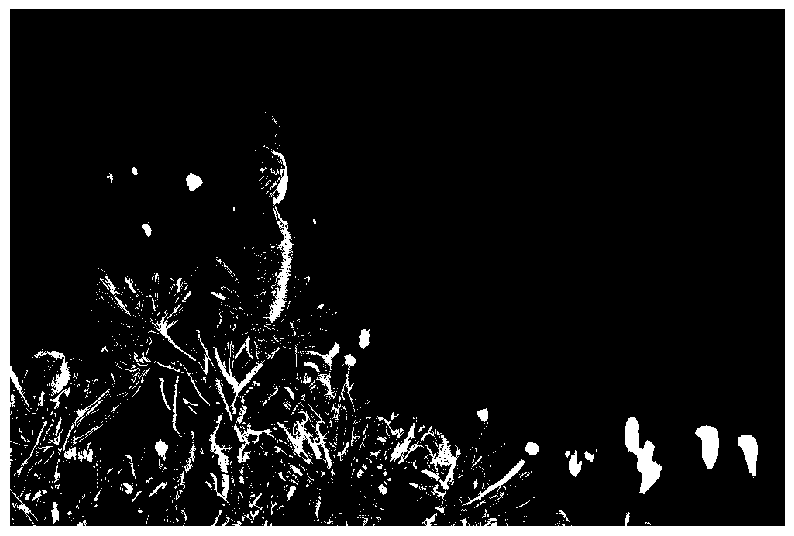

Height: 667
Width: 1000
Channels: 1


In [11]:
# This should crop the bird from the  image; you will need to adjust the parameters for the correct crop size and location

crop_img = crop(image1, 278, 5, 508, 272)
display(crop_img)
print_stats(crop_img)

resize_img = resize(crop_img, 500, 600)
display(resize_img)
print_stats(resize_img)

contrast_img = change_contrast(image1, 0.5)
display(contrast_img)
print_stats(contrast_img)

contrast_img = change_contrast(image1, 1.5)
display(contrast_img)
print_stats(contrast_img)

grey_img = greyscale(image1)
display(grey_img)
print_stats(grey_img)

binary_img = binary(grey_img, 0.3)
display(binary_img)
print_stats(binary_img)

binary_img = binary(grey_img, 0.7)
display(binary_img)
print_stats(binary_img)

# Add your own tests here...


Altering threshold of a binary operation has great effect on the pixel segmentation of a picture by specifying which of them would be white (foreground) or black (background). At the lower thresholds, even the darker objects would be white thus making the binary image brighter at the cost of details that might combine into the white pixel (or loss of the fine details as a whole). On the other hand, use of high thresholds is selective and only the brightest pixels will appear white leaving the rest of the picture in black thus missing some of the details in the middle-tones. One that is intermediate between the extremes of these effects usually maintains the overall pattern and layout of significant details at the expense of limiting noise. In sum, normalizing the threshold constitutes a pivotal part of preprocessing any image that influences the quality and success of further analysis, an edge detection or objectation segmentation to be precise, by regulating the strictness of the pixel color determination.

## Question 3: Image filtering (20%)

### 3.1(a) 2D cross-correlation

Using the definition of 2D cross-correlation from week 1, implement the cross-correlation operation in the function `xcorr2D()` in a1code.py.


In [12]:
from a1code import xcorr2D
test_xcorr2D()

Within the process of 2D cross-correlation, we move a small matrix (which is referred to as the kernel) across an image to calculate how well it fits the various parts of the picture. We run the same result at every coordinate: we take the overlapping values of the kernel and an image, multiply them, and add to obtain the single output pixel value. This algorithm gives a new picture in which some patterns are highlighted based on the kernel.
Having tested a simple kernel on a black picture with a black picture of the white square, I saw that the output is marked with the places of overlap of the white square with the pattern of the kernel, the more overlap, the more high the value of the pixel that is the result of the operation. This demonstrates that cross-correlation can be applied in pattern finding and feature basis. It is also a basic operation in most computer vision applications and neural networks (such as CNNs), where various kernels may be applied to find out edges, textures or other visual patterns in images.
This leaves a 9x9 matrix (you may imagine this much like a small gray scale picture).
Each pixel is zero (black) to start with.

### 3.1(b) 2D convolution

Using the definition of 2D convolution from week 1, implement the convolution operation in the function `conv2D()` in a1code.py.

In [15]:
from a1code import test_xcorr2D
test_conv2D()

2D convolution is similar to moving a small window (known as a kernel or filter) along an image in the hope of finding something interesting. At every place we multiply the filter by the corresponding fraction of the image and then add the result to get a single number. This value is added to another image termed the output feature map. As we slide this filter over the image, in effect top to bottom, left to right, we are creating another version of the image in which we are accentuating some features. As an example, there are filters that render edges conspicuous and there are filters that blur the image too. It is similar to image processing through a stencil taking step by step changes or identification of features.

The reshaping of filter (known also as a kernel) in 2D convolution consists of applying a reflection (both horizontal and vertical) to it, prior to convolving the image with the kernel. This implies that the numbers in the kernel are rotated at 180 prior to sliding it over the image to generate the output. Contrastingly, there is no flipping involved in 2D cross-correlation, kernel is applied as is. It is placed directly on top of the image explicitly when the sliding operation is done. The difference of the flipping is what makes a difference in the mathematical sense of convolution and cross-correlation in spite of the fact that the steps are very similar.

### 3.1(c) RGB convolution

In the function `conv` in a1code.py, extend your function `conv2D` to work on RGB images, by applying the 2D convolution to each channel independently.

In [16]:
from a1code import conv

In [17]:
from PIL import Image
img = Image.open('rgbcity.jpg')
if img.mode != 'RGB':
    img = img.convert('RGB')
img_np = np.array(img).astype(np.float32)
img_np /= 255.0

kernel = np.array([
    [1, 0, -1],
    [2, 0, -2],
    [1, 0, -1]
])

output = conv(img_np, kernel)

output_c = np.clip(output, 0, 1)
output_img = (output_c * 255).astype(np.uint8)

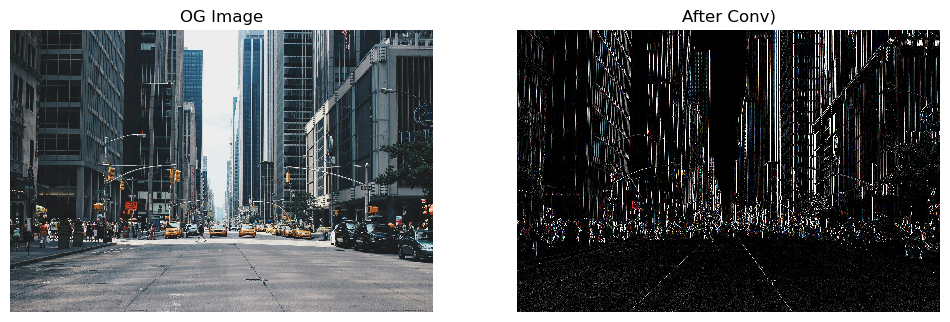

In [18]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title('OG Image')
plt.imshow(img_np)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('After Conv)')
plt.imshow(output_img)
plt.axis('off')

plt.show()

### 3.2 Gaussian filter convolution

Use the `gauss2D` function provided in a1code.py to create a Gaussian kernel, and apply it to your images with convolution. You will obtain marks for trying different tests and analysing the results, for example:

- try varying the image size, and the size and variance of the filter  
- subtract the filtered image from the original - this gives you an idea of what information is lost when filtering

What do you observe and why?

In [20]:
img2 = Image.open("B&W.jpg")
img2_np = np.array(img2).astype(float) / 255.0

kernel = gauss2D(size=11, sigma=3)

blur_img2 = conv(img2_np, kernel)

blur_img2 = np.clip(blur_img2, 0, 1)
blurred_img2 = (blur_img2 * 255).astype(np.uint8)

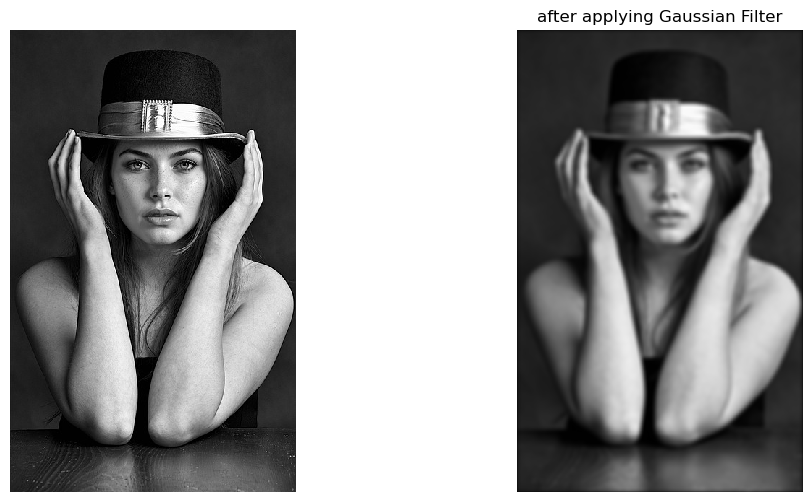

In [21]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(img2_np)
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("after applying Gaussian Filter")
plt.imshow(blurred_img2)
plt.axis("off")

plt.show()

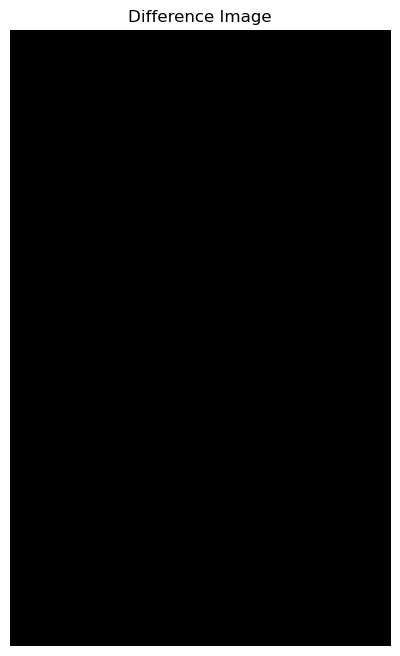

In [22]:
difference = img2_np - blurred_img2
difference = np.clip(difference, 0, 1)

plt.imshow(difference)
plt.title("Difference Image")
plt.axis('off')
plt.show()

Most of the image appears black.
The blurred image is very similar to the original in most areas.In order to subtract the Gaussian-blurred image and the original image, I got the result to be all black. This is given the fact that the pixel values in the result were mainly very small or negative as a result of the similarity between the original and the blurred pictures. The minor differences could not be seen since image display turns values of less than 0 to be black. This is why it is important to normalize or change the scale of pixel values into a visible one to see the differences the best way, including, e.g., edges, or fine details that should be displayed as a result of such an operation.

### 3.3 Sobel filters

Define a horizontal and vertical Sobel edge filter kernel and test them on your images. You will obtain marks for testing them and displaying results in interesting ways, for example:

- apply them to an image at different scales
- considering how to display positive and negative gradients
- apply different combinations of horizontal and vertical filters as asked in the Assignment sheet.

In [33]:
sobel_horizontal = np.array([
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]
])

sobel_vertical = np.array([
    [-1, -2, -1],
    [ 0,  0,  0],
    [ 1,  2,  1]
])

In [34]:
from PIL import Image

def apply_sobel_filters(image_path):
    img = Image.open(image_path).convert('L') 
    img_np = np.array(img) / 255.0 

    edge_x = conv2D(img_np, sobel_horizontal)
    edge_y = conv2D(img_np, sobel_vertical)

    # Combine the two gradients
    edge_magnitude = np.sqrt(edge_x**2 + edge_y**2)
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(edge_x, cmap='gray')
    plt.title('Horizontal Edges')
    
    plt.subplot(1, 3, 2)
    plt.imshow(edge_y, cmap='gray')
    plt.title('Vertical Edges')

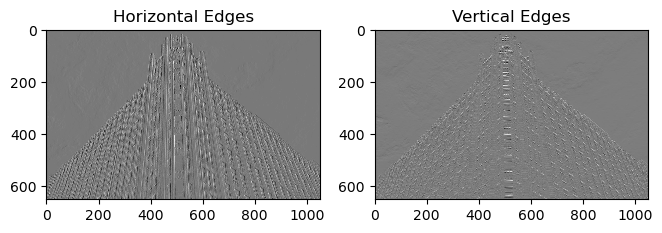

In [ ]:
apply_sobel_filters('building.jpg')

Sobel filters are a type of edge detection technique used in image processing to highlight areas where the image brightness changes sharply, which often correspond to edges or boundaries within the image. They work by applying two separate 3x3 kernels—one detects horizontal changes (edges running vertically), and the other detects vertical changes (edges running horizontally). When these filters are applied to an image, they calculate the gradient of pixel intensities in the horizontal and vertical directions, producing two separate images that emphasize edges along these directions. By combining these two results, we get an edge magnitude image that shows the overall strength of edges regardless of orientation. After applying Sobel filters, the observed output typically highlights outlines of objects and textures in the image, making it easier to identify shapes, contours, and important structural details. This is useful for tasks like object recognition, image segmentation, and feature extraction, as it simplifies the complex image data into key features that describe the geometry and boundaries within the scene.


## Question 4: Image sampling and pyramids (25%)

### 4.1 Image Sampling

- Apply your `resize()` function to reduce an image (I) to 0.5\*height and 0.5\*width

- Repeat the above procedure, but apply a Gaussian blur filter to your original image before downsampling it. How does the result compare to your previous output, and to the original image? Why?


### 4.2 Image Pyramids
- Create a Gaussian pyramid as described in week2's lecture on an image.

- Apply a Gaussian kernel to an image I, and resize it with ratio 0.5, to get $I_1$. Repeat this step to get $I_2$, $I_3$ and $I_4$.

- Display these four images in a manner analogus to the example shown in the lectures.




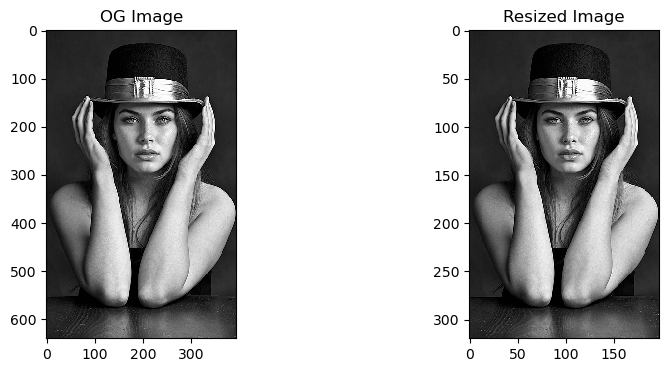

In [43]:
from skimage.io import imread

image = imread('B&W.jpg')

def resize(image, out_height, out_width):
    in_height, in_width = image.shape[:2]

    if image.ndim == 2:
        resized_image = np.zeros((out_height, out_width), dtype=image.dtype)
        for i in range(out_height):
            for j in range(out_width):
                x = int(i * in_height / out_height)
                y = int(j * in_width / out_width)
                resized_image[i, j] = image[x, y]
    else:
        channels = image.shape[2]
        resized_image = np.zeros((out_height, out_width, channels), dtype=image.dtype)
        for i in range(out_height):
            for j in range(out_width):
                x = int(i * in_height / out_height)
                y = int(j * in_width / out_width)
                resized_image[i, j] = image[x, y]
    
    return resized_image

original_height, original_width = image.shape[:2]
new_height = int(original_height * 0.5)
new_width = int(original_width * 0.5)

resized_image = resize(image, new_height, new_width)

plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray' if image.ndim == 2 else None)
plt.title("OG Image")

plt.subplot(1, 2, 2)
plt.imshow(resized_image, cmap='gray' if image.ndim == 2 else None)
plt.title("Resized Image")
plt.show()


Left: Full size, sharp details of original grayscale image(original). Right: Resized image - reduced by 50 percent in size both vertically and horizontally. The reduced image retains the significant details (face, hat) just with a reduced resolution. Downsampling causes some small details (such as skin texture and hair strands) to be lost a bit. The picture is even sharp as it was not blurred during resizing.



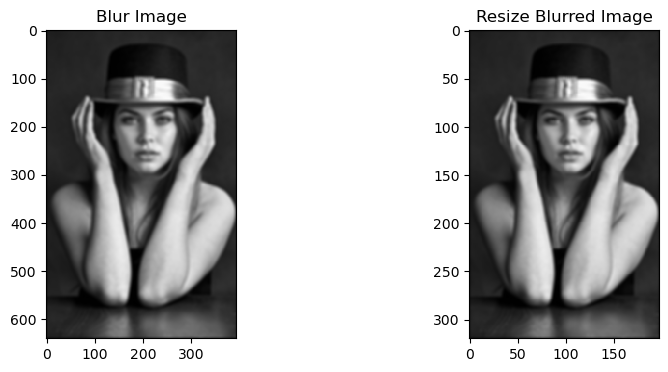

In [47]:
original_height, original_width = blurred_img2.shape[:2]

new_height = int(original_height * 0.5)
new_width = int(original_width * 0.5)

resized_blurred = resize(blurred_img2, new_height, new_width)

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.imshow(blurred_img2, cmap='gray' if blurred_img2.ndim == 2 else None)
plt.title('Blur Image')

plt.subplot(1, 2, 2)
plt.imshow(resized_blurred, cmap='gray' if blurred_img2.ndim == 2 else None)
plt.title('Resize Blurred Image')

plt.show()

When I used the resize command, half down sample a smooth original image, there was some degree of perdity or even blockiness to the down sampled version, particularly at edges and pseudo edges. This is because just selecting pixels to reduce the size of the image may result in aliasing artifacts, in which high frequency can be lost, or oversampled. However, when I used Gaussian blur filter to the original image and then the downsampling occurred, the smaller image had a smoother appearance and more natural transitions were not lost. This blur can be thought of as a low-pass filter, stripping away high-frequency terms that result in aliasing and result in a more clean, and less noisy down-sampled image. The blurred-then-resized result possesses an additional benefit of having fewer artifacts and still looks more realistic than the original like the previous output, which may look a bit softer because of the blur effect. This shows why it is important to pre-filter (anti-aliasing) and then resize to acquire better quality image.

In [50]:
from skimage.filters import gaussian
from skimage.transform import resize

I1 = blurred_img2 / 255.0 

I1_blurred = gaussian(I1, sigma=1, channel_axis=-1) 
I2 = resize(I1_blurred, (I1.shape[0] // 2, I1.shape[1] // 2), anti_aliasing=True)

I2_blurred = gaussian(I2, sigma=1, channel_axis=-1)
I3 = resize(I2_blurred, (I2.shape[0] // 2, I2.shape[1] // 2), anti_aliasing=True)

I3_blurred = gaussian(I3, sigma=1, channel_axis=-1)
I4 = resize(I3_blurred, (I3.shape[0] // 2, I3.shape[1] // 2), anti_aliasing=True)

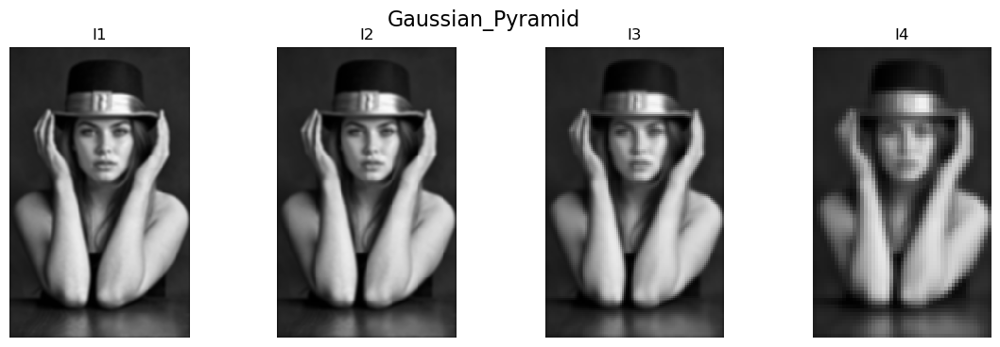

In [52]:
images = [I1, I2, I3, I4]
title = ['I1', 'I2', 'I3', 'I4']

plt.figure(figsize=(14, 4))

for i, (img, title) in enumerate(zip(images, title)):
    plt.subplot(1, 4, i + 1)
    plt.imshow(img, cmap='gray' if img.ndim == 2 else None)
    plt.title(title)
    plt.axis('off')

plt.suptitle("Gaussian_Pyramid", fontsize=16)
plt.show()

## Question 5: Implement a blob detector (25%)

The image filtering lectures, particularly Lecture 2, have covered the details related to this question.

### 5.1 Apply and analyse a blob detector

- Create a Laplacian of Gaussian (LoG) filter in the function `LoG2D()` and visualize its response on your images. You can use the template function (and hints therein) for the task if you wish.

- Modify parameters of the LoG filters and apply them to an image of your choice. Show how these variations are manifested in the output.

- Repeat the experiment by rescaling the image with a combination of appropriate filters designed by you for these assignment. What correlations do you find when changing the scale or modifying the filters?

- How does the response of LoG filter change when you rotate the image by 90 degrees? You can write a function to rotate the image or use an externally rotated image for this task.





In [77]:
from a1code import LoG2D

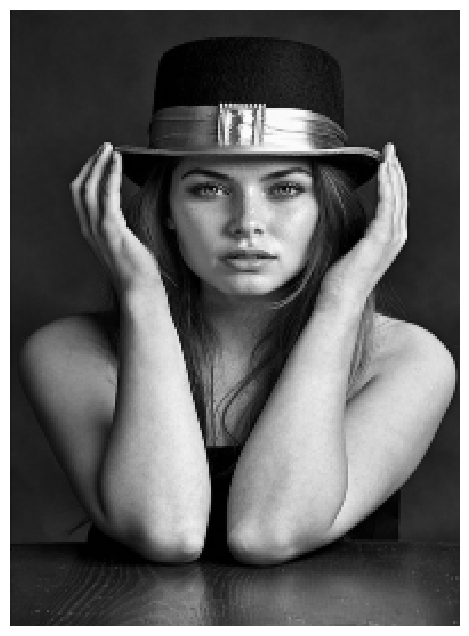

Height: 270
Width: 197
Channels: 3


In [78]:
resized_img = resize(image, (270, 197), anti_aliasing=True)
display(resized_img)
print_stats(resized_img)

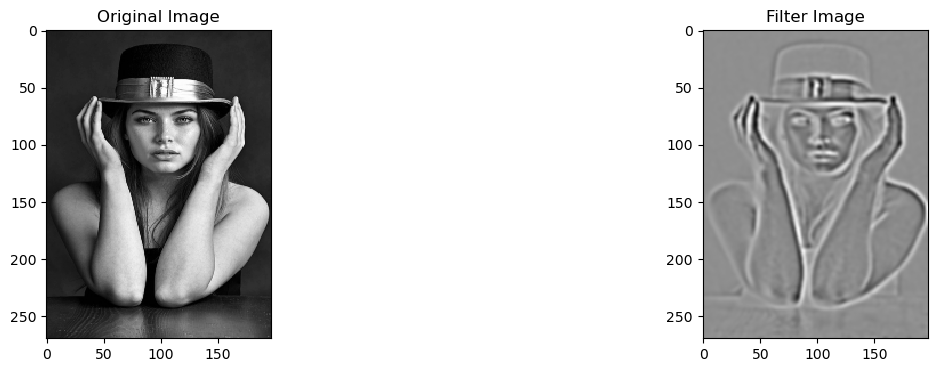

In [85]:
log_filter = LoG2D(size=15, sigma=2)

if resized_img.dtype == np.float64:
    resized_img1= (resized_img * 255).clip(0, 255).astype(np.uint8)
else:
    resized_img1 = resized_img

if resized_img1.ndim == 3:
    resized_grayimage = cv2.cvtColor(resized_img1, cv2.COLOR_RGB2GRAY)
else:
    resized_grayimage = resized_img1

filtered_img = ndimage.convolve(resized_grayimage.astype(float), log_filter)

plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(resized_grayimage, cmap='gray')
plt.title("Original Image")

plt.subplot(1, 3, 3)
plt.imshow(filtered_img, cmap='gray')
plt.title("Filter Image")
plt.show()


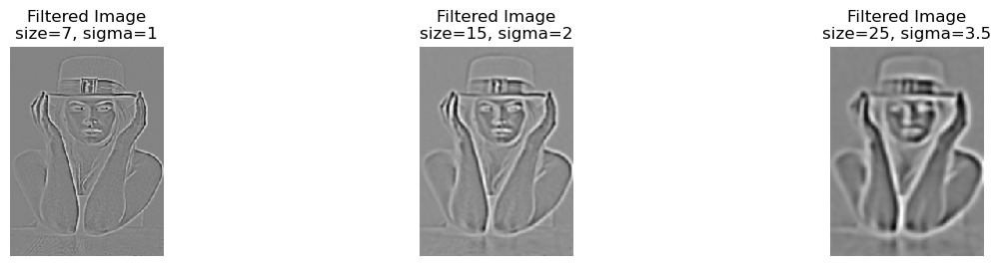

In [89]:
log_parameters = [
    (7, 1),    
    (15, 2),  
    (25, 3.5)  
]

plt.figure(figsize=(15, 6))

for i, (size, sigma) in enumerate(log_parameters):
    log_filter = LoG2D(size=size, sigma=sigma)

    filtered_img = ndimage.convolve(resized_grayimage.astype(float), log_filter)

    plt.subplot(2, len(log_params), i + 1 + len(log_parameters))
    plt.imshow(filtered_img, cmap='gray')
    plt.title(f'Filtered Image\nsize={size}, sigma={sigma}')
    plt.axis('off')
plt.show()


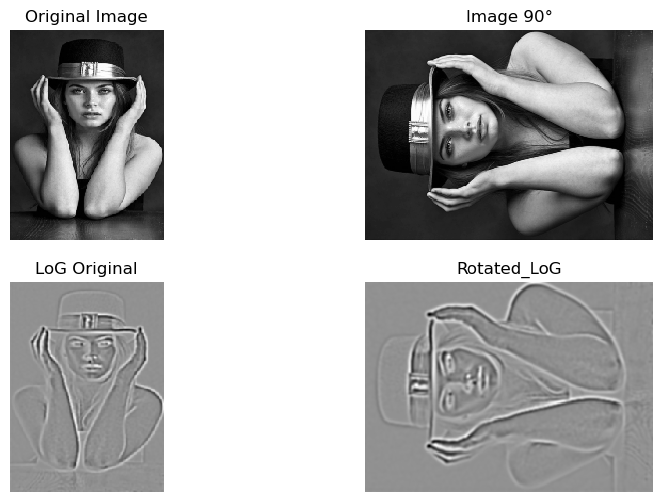

In [93]:
from skimage.transform import rotate

rotated_img = rotate(resized_grayimage, angle=90, resize=True)

log_filter = LoG2D(size=15, sigma=1.5)

original_log = ndimage.convolve(resized_grayimage.astype(float), log_filter)
rotated_log = ndimage.convolve(rotated_img.astype(float), log_filter)

plt.figure(figsize=(10, 6))

plt.subplot(2, 2, 1)
plt.imshow(resized_grayimage, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(rotated_img, cmap='gray')
plt.title("Image 90°")
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(original_log, cmap='gray')
plt.title("LoG Original")
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(rotated_log, cmap='gray')
plt.title("Rotated_LoG")
plt.axis('off')

plt.show()


By applying the LoG filter on the original grayscale image and also on the original grayscale image with a rotation of 90 degree, I observed that the responses of the filter were quite similar regarding the feature that is being detected. The corners and balls created by the LoG filter were visible in both pictures and the filtered result of the rotated image was simply a rotated image of the original filtered image. This demonstrates that the LoG filter is rotation-invariant and it recognizes features (on the basis of changes in intensity) irrespective of the orientation of the image. The fact that there might still be minor differences between the two filtered images may be attributable to interpolation present during the rotation or an edge effect present during convolution, but in general the LoG filter is reliable in terms of feature detection although rotated.
